Ortak kullanılan library

In [1]:
import pandas as pd
from pathlib import Path
import random

def get_csv_path():
  return "/kaggle/train_df_2.csv" # Changed to point to the correctly generated CSV
  # return r"C:\PythonProject\2.donem projeleri\SayisalGoruntu\SkinCancerISIC\train_df.csv"
def get_default_root():
  return "/kaggle"

def load_dataframe(csv_path=None):
    if csv_path is None:
        csv_path = get_csv_path()
    return pd.read_csv(csv_path)

def sample_images(df, n=10, random_state=42):
    return df.sample(n=n, random_state=random_state)

Kaggledan dosyaların download edilmesi

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("nodoubttome/skin-cancer9-classesisic")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'skin-cancer9-classesisic' dataset.
Path to dataset files: /kaggle/input/skin-cancer9-classesisic


1.Tüm resimlerin özellikleri ile datasetin oluşturulması

In [3]:
from pathlib import Path
import argparse
import pandas as pd
import cv2


def build_dataframe(root_path: Path):
    exts = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    rows = []
    root = Path(root_path)
    if not root.exists():
        raise FileNotFoundError(f"Root path does not exist: {root}")

    for p in root.rglob('*'):
        if p.is_file() and p.suffix.lower() in exts:
            parent = p.parent
            label = parent.name
            split = parent.parent.name if parent.parent is not None else ''
            img = cv2.imread(str(p))
            if img is None:
                height = None
                width = None
                channel_type = 'unknown'
            else:
                height, width = img.shape[:2]
                if len(img.shape) == 2:
                    channel_type = 'grayscale'
                elif len(img.shape) == 3:
                    if img.shape[2] == 3:
                        channel_type = 'rgb'
                    elif img.shape[2] == 4:
                        channel_type = 'rgba'
                    else:
                        channel_type = f'{img.shape[2]} channels'
                else:
                    channel_type = 'unknown'
            # Dosya boyutu (byte)
            file_size = p.stat().st_size
            # Sınıflandırma
            if file_size < 50*1024:
                size_class = '0-50kb'
            elif file_size < 150*1024:
                size_class = '50-150kb'
            elif file_size < 500*1024:
                size_class = '150-500kb'
            else:
                size_class = '500kb+'
            rows.append({
                'filepath': str(p.resolve()),
                'filename': p.name,
                'label': label,
                'split': split,
                'width': width,
                'height': height,
                'size_class': size_class,
                'channel_type': channel_type,
            })

    df = pd.DataFrame(rows)
    return df


def main():
    default_root = get_default_root()
    parser = argparse.ArgumentParser(description='Create train_df from image dataset folder')
    parser.add_argument('--root', '-r', default=default_root, help='Root folder to scan')
    parser.add_argument('--out', '-o', default=None, help='Output CSV path (default: <root>/train_df.csv)')
    args = parser.parse_args([]) # Modified line: pass an empty list to parse_args()

    root = Path(args.root)
    if args.out:
        out_path = Path(args.out)
    else:
        out_path = root /'train_df_2.csv'

    print(f"Scanning root: {root}")
    df = build_dataframe(root)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    df.to_csv(out_path, index=False)
    #print(f"Total images found: {len(df)}")
    print(f"Saved CSV to: {out_path}")


if __name__ == '__main__':
    main()
    # Sonuçları göster
    csv_path = get_csv_path()
    try:
        df = pd.read_csv(csv_path)
        print("\nİlk 10 kayıt:")
        print(df.head(10))
        print(f"\nToplam kayıt sayısı: {len(df)}")
    except Exception as e:
        print(f"CSV okunamadı: {e}")

Scanning root: /kaggle
Saved CSV to: /kaggle/train_df_2.csv

İlk 10 kayıt:
                                            filepath          filename  \
0  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024371.jpg   
1  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024358.jpg   
2  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024337.jpg   
3  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024382.jpg   
4  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024420.jpg   
5  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024409.jpg   
6  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024336.jpg   
7  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024422.jpg   
8  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024408.jpg   
9  /kaggle/input/skin-cancer9-classesisic/Skin ca...  ISIC_0024381.jpg   

                        label split  width  height size_class channel_type  
0  pigmented benign keratosis  Te

2.RGB, Grayscale ve Histogram Görüntüleri

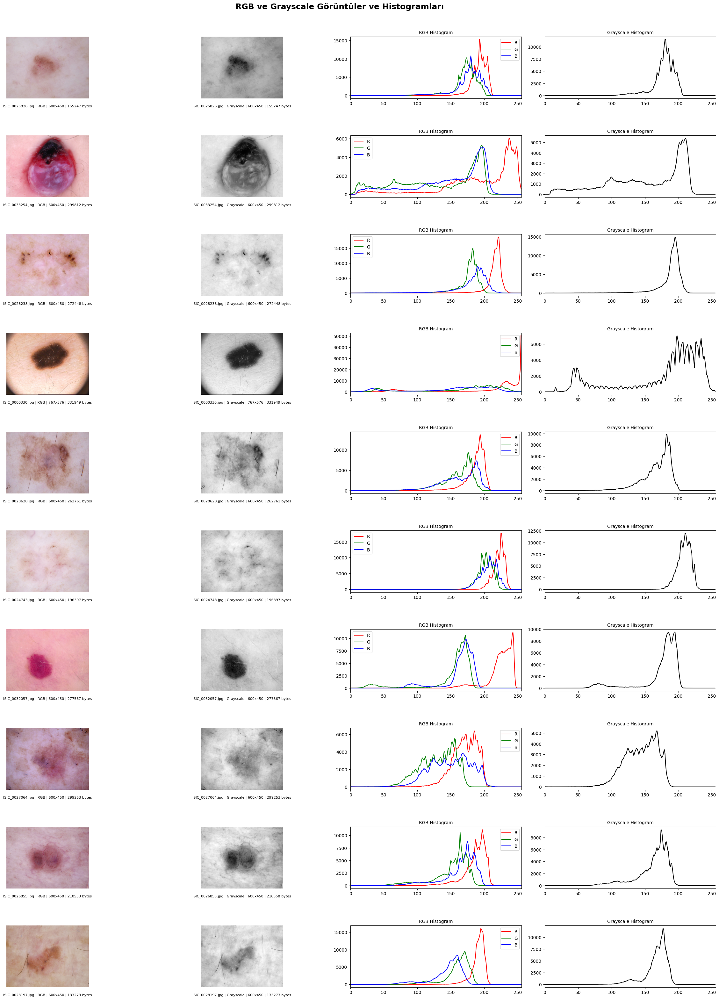

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# DataFrame'i yükle
train_df = load_dataframe()

# # Rastgele 10 görüntü seç
sample_df = sample_images(train_df, n=10, random_state=42)

fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(24, 32))
fig.suptitle('RGB ve Grayscale Görüntüler ve Histogramları', fontsize=18, fontweight='bold')

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    file_size = Path(img_path).stat().st_size if Path(img_path).exists() else 0
    if img is None:
        rgb_img = None
        gray_img = None
        rgb_info = f"Yüklenemedi | {row.filename} | Dosya boyutu: {file_size} bytes"
        gray_info = f"Yüklenemedi | {row.filename} | Dosya boyutu: {file_size} bytes"
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rgb_info = f"{row.filename} | RGB | {row.width}x{row.height} | {file_size} bytes"
        gray_info = f"{row.filename} | Grayscale | {row.width}x{row.height} | {file_size} bytes"
    #RGB
    axes[idx, 0].imshow(rgb_img)
    axes[idx, 0].axis('off')
    axes[idx, 0].text(0.5, -0.10, rgb_info, fontsize=8, ha='center', va='top', transform=axes[idx, 0].transAxes, wrap=False)
    #Grayscale
    axes[idx, 1].imshow(gray_img, cmap='gray')
    axes[idx, 1].axis('off')
    axes[idx, 1].text(0.5, -0.10, gray_info, fontsize=8, ha='center', va='top', transform=axes[idx, 1].transAxes, wrap=False)
    #RGB Histogram
    axes[idx, 2].clear()
    if img is not None:
        colors = ('r', 'g', 'b')
        for i, color in enumerate(colors):
            hist = cv2.calcHist([rgb_img], [i], None, [256], [0,256])
            axes[idx, 2].plot(hist, color=color, label=f'{color.upper()}')
        axes[idx, 2].set_xlim([0,256])
        axes[idx, 2].set_title('RGB Histogram', fontsize=10)
        axes[idx, 2].legend()
    else:
        axes[idx, 2].set_title('RGB Histogram (Yok)', fontsize=10)
    #Grayscale Histogram
    axes[idx, 3].clear()
    if img is not None:
        hist_gray = cv2.calcHist([gray_img], [0], None, [256], [0,256])
        axes[idx, 3].plot(hist_gray, color='black')
        axes[idx, 3].set_xlim([0,256])
        axes[idx, 3].set_title('Grayscale Histogram', fontsize=10)
    else:
        axes[idx, 3].set_title('Grayscale Histogram (Yok)', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.subplots_adjust(hspace=0.6)
plt.show()


3.Histogram Eşitleme ve Gamma Düzeltme Sonuçları

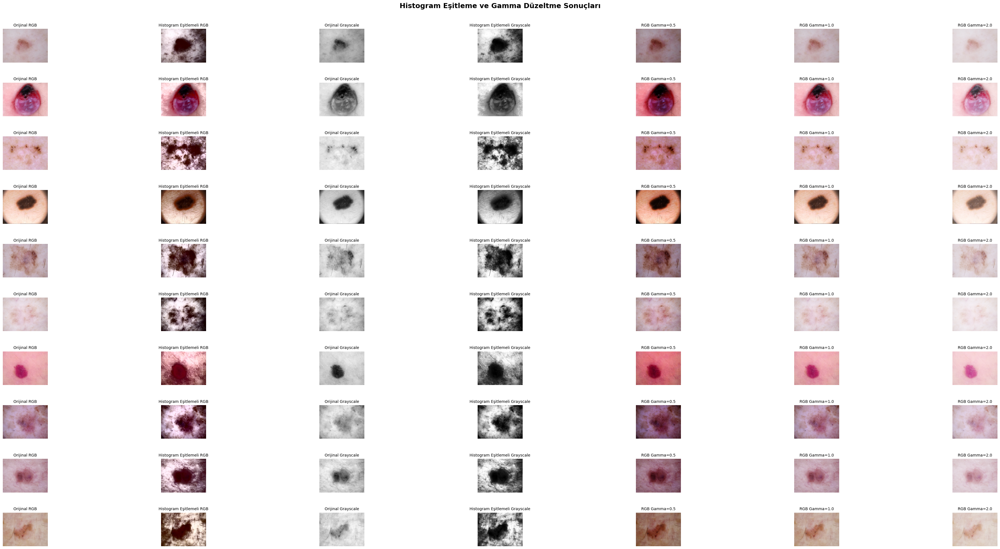

In [ ]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def contrast_stretch_channel(channel):
    import numpy as np
    min_val = np.min(channel)
    max_val = np.max(channel)
    if max_val > min_val:
        stretched = ((channel - min_val) * 255 / (max_val - min_val)).astype(np.uint8)
    else:
        stretched = channel.copy()
    return stretched

def contrast_stretch_rgb(img):
    import cv2
    channels = cv2.split(img)
    stretched_channels = [contrast_stretch_channel(c) for c in channels]
    return cv2.merge(stretched_channels)

def contrast_stretch_gray(img):
    return contrast_stretch_channel(img)

def equalize_histogram_rgb(img):
    import cv2
    ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    y, cr, cb = cv2.split(ycrcb)
    y_eq = cv2.equalizeHist(y)
    ycrcb_eq = cv2.merge([y_eq, cr, cb])
    rgb_eq = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2RGB)
    return rgb_eq

def equalize_histogram_gray(img):
    import cv2
    return cv2.equalizeHist(img)

def gamma_correction(img, gamma):
    import numpy as np
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype('uint8')
    return cv2.LUT(img, table)

# DataFrame'i yükle
train_df = load_dataframe()

# Rastgele 5 görüntü seç (görselleştirme için daha kompakt)
sample_df = sample_images(train_df, n=10, random_state=42)

fig, axes = plt.subplots(nrows=10, ncols=7, figsize=(42, 20))
fig.suptitle('Histogram Eşitleme ve Gamma Düzeltme Sonuçları', fontsize=18, fontweight='bold')

gamma_values = [0.5, 1.0, 2.0]

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    file_size = Path(img_path).stat().st_size if Path(img_path).exists() else 0
    if img is None:
        rgb_img = None
        gray_img = None
        rgb_eq = None
        gray_eq = None
        rgb_info = f"Yüklenemedi | {row.filename} | Dosya boyutu: {file_size} bytes"
        gray_info = f"Yüklenemedi | {row.filename} | Dosya boyutu: {file_size} bytes"
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rgb_eq = equalize_histogram_rgb(rgb_img)
        gray_eq = equalize_histogram_gray(gray_img)
        rgb_info = f"{row.filename} | RGB | {row.width}x{row.height} | {file_size} bytes"
        gray_info = f"{row.filename} | Grayscale | {row.width}x{row.height} | {file_size} bytes"
    # Orijinal RGB
    axes[idx, 0].imshow(rgb_img)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('Orijinal RGB', fontsize=10)
    # Histogram Eşitlemeli RGB
    axes[idx, 1].imshow(rgb_eq)
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Histogram Eşitlemeli RGB', fontsize=10)
    # Orijinal Grayscale
    axes[idx, 2].imshow(gray_img, cmap='gray')
    axes[idx, 2].axis('off')
    axes[idx, 2].set_title('Orijinal Grayscale', fontsize=10)
    # Histogram Eşitlemeli Grayscale
    axes[idx, 3].imshow(gray_eq, cmap='gray')
    axes[idx, 3].axis('off')
    axes[idx, 3].set_title('Histogram Eşitlemeli Grayscale', fontsize=10)
    # Gamma düzeltmeli RGB (gamma=0.5, 1.0, 2.0)
    for gidx, gamma in enumerate(gamma_values):
        if rgb_img is not None:
            rgb_gamma = gamma_correction(rgb_img, gamma)
            axes[idx, 4+gidx].imshow(rgb_gamma)
            axes[idx, 4+gidx].axis('off')
            axes[idx, 4+gidx].set_title(f'RGB Gamma={gamma}', fontsize=10)
        else:
            axes[idx, 4+gidx].axis('off')
            axes[idx, 4+gidx].set_title(f'RGB Gamma={gamma}', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.subplots_adjust(hspace=0.6)
plt.show()


4.Median Blur ve Gaussian Blur İşlemleri

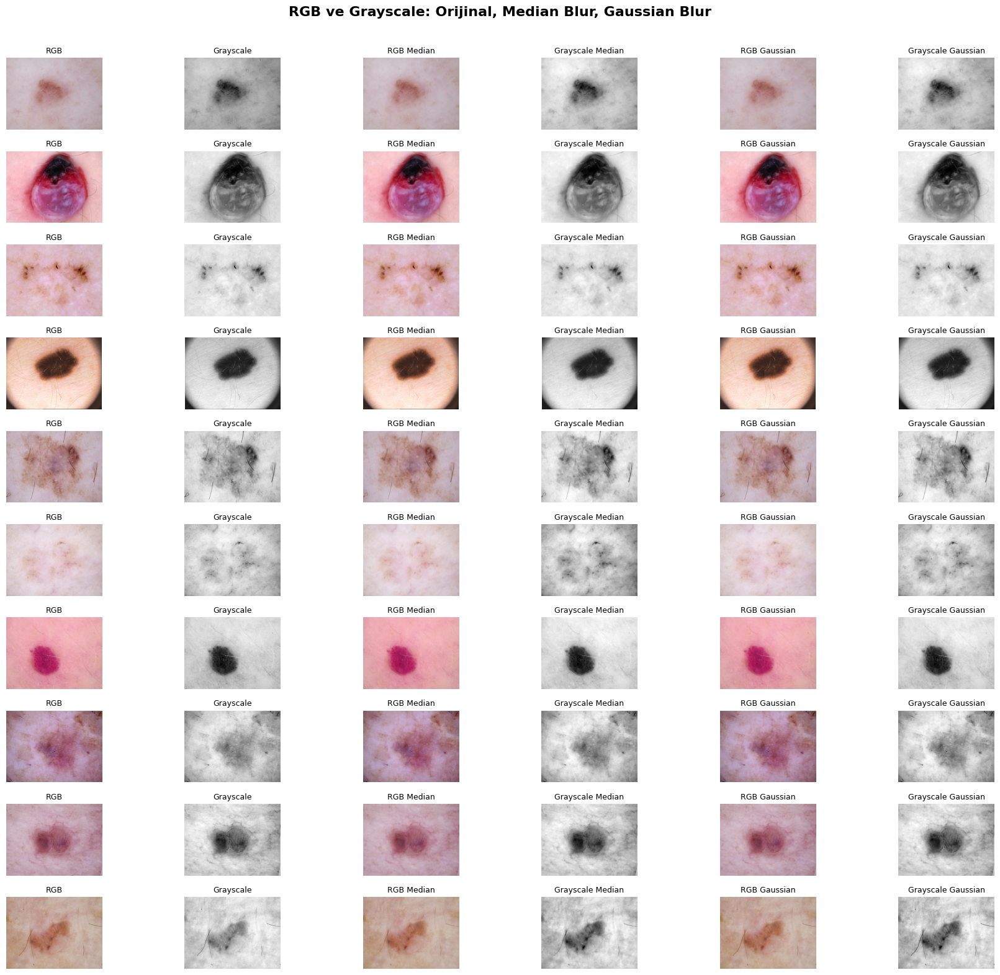

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# DataFrame'i yükle
train_df = load_dataframe()

# Rastgele 10 görüntü seç
sample_df = sample_images(train_df, n=10, random_state=42)

fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(18, 16))
fig.suptitle('RGB ve Grayscale: Orijinal, Median Blur, Gaussian Blur', fontsize=16, fontweight='bold')

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    if img is None:
        rgb_img = None
        gray_img = None
        rgb_median = None
        gray_median = None
        rgb_gaussian = None
        gray_gaussian = None
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rgb_median = cv2.medianBlur(rgb_img, 5)
        gray_median = cv2.medianBlur(gray_img, 5)
        rgb_gaussian = cv2.GaussianBlur(rgb_img, (5, 5), 0)
        gray_gaussian = cv2.GaussianBlur(gray_img, (5, 5), 0)
    # Orijinal RGB
    axes[idx, 0].imshow(rgb_img)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('RGB', fontsize=9)
    # Orijinal Grayscale
    axes[idx, 1].imshow(gray_img, cmap='gray')
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Grayscale', fontsize=9)
    # RGB Median
    axes[idx, 2].imshow(rgb_median)
    axes[idx, 2].axis('off')
    axes[idx, 2].set_title('RGB Median', fontsize=9)
    # Grayscale Median
    axes[idx, 3].imshow(gray_median, cmap='gray')
    axes[idx, 3].axis('off')
    axes[idx, 3].set_title('Grayscale Median', fontsize=9)
    # RGB Gaussian
    axes[idx, 4].imshow(rgb_gaussian)
    axes[idx, 4].axis('off')
    axes[idx, 4].set_title('RGB Gaussian', fontsize=9)
    # Grayscale Gaussian
    axes[idx, 5].imshow(gray_gaussian, cmap='gray')
    axes[idx, 5].axis('off')
    axes[idx, 5].set_title('Grayscale Gaussian', fontsize=9)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.subplots_adjust(hspace=0.3)
plt.show()


5.Rotate ve Flip İşlemleri

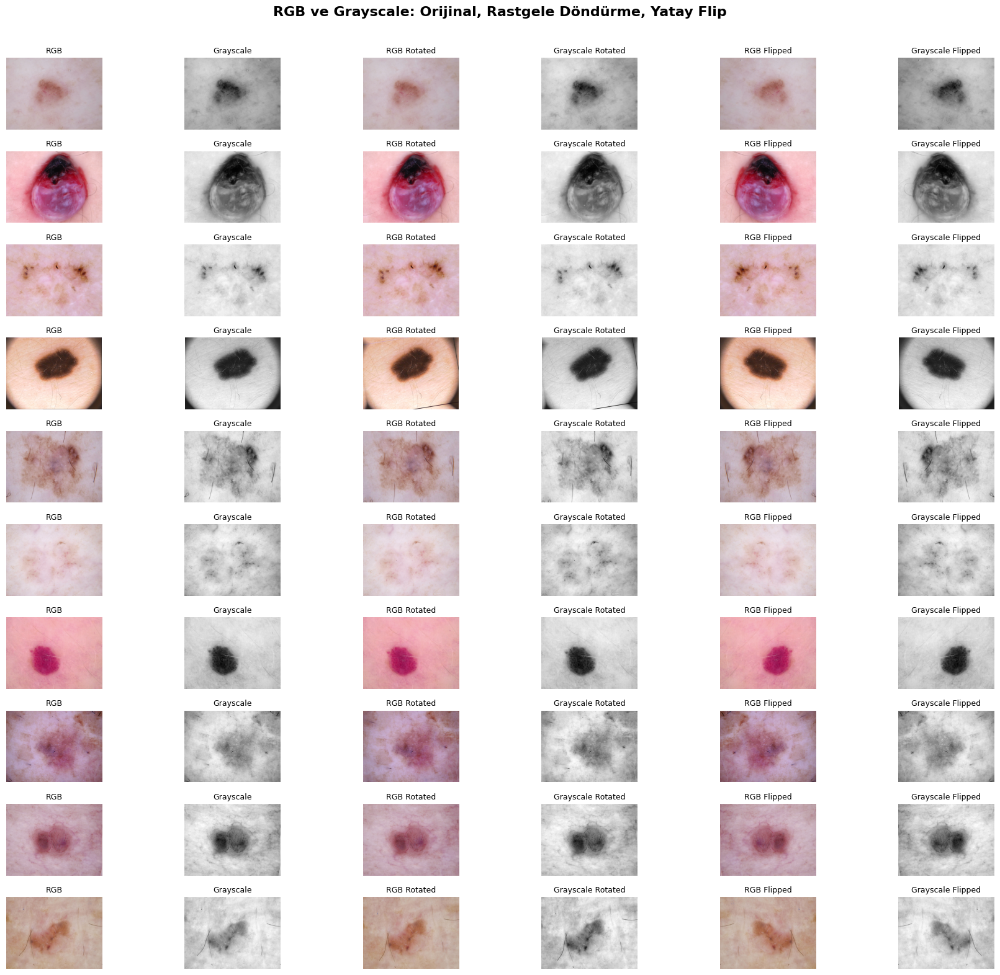

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
from pathlib import Path

# DataFrame'i yükle
train_df = load_dataframe()

# Rastgele 10 görüntü seç
sample_df = sample_images(train_df, n=10, random_state=42)

fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(18, 16))
fig.suptitle('RGB ve Grayscale: Orijinal, Rastgele Döndürme, Yatay Flip', fontsize=16, fontweight='bold')

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    if img is None:
        rgb_img = None
        gray_img = None
        rgb_rot = None
        gray_rot = None
        rgb_flip = None
        gray_flip = None
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Rastgele döndürme açısı
        angle = random.uniform(0, 10)
        # RGB döndürme
        h, w = rgb_img.shape[:2]
        M_rgb = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
        rgb_rot = cv2.warpAffine(rgb_img, M_rgb, (w, h), borderMode=cv2.BORDER_REFLECT)
        # Grayscale döndürme
        h_g, w_g = gray_img.shape[:2]
        M_gray = cv2.getRotationMatrix2D((w_g/2, h_g/2), angle, 1)
        gray_rot = cv2.warpAffine(gray_img, M_gray, (w_g, h_g), borderMode=cv2.BORDER_REFLECT)
        # Yatay flip
        rgb_flip = cv2.flip(rgb_img, 1)
        gray_flip = cv2.flip(gray_img, 1)
    # Orijinal RGB
    axes[idx, 0].imshow(rgb_img)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('RGB', fontsize=9)
    # Orijinal Grayscale
    axes[idx, 1].imshow(gray_img, cmap='gray')
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Grayscale', fontsize=9)
    # Rastgele döndürülmüş RGB
    axes[idx, 2].imshow(rgb_rot)
    axes[idx, 2].axis('off')
    axes[idx, 2].set_title('RGB Rotated', fontsize=9)
    # Rastgele döndürülmüş Grayscale
    axes[idx, 3].imshow(gray_rot, cmap='gray')
    axes[idx, 3].axis('off')
    axes[idx, 3].set_title('Grayscale Rotated', fontsize=9)
    # Yatay flip RGB
    axes[idx, 4].imshow(rgb_flip)
    axes[idx, 4].axis('off')
    axes[idx, 4].set_title('RGB Flipped', fontsize=9)
    # Yatay flip Grayscale
    axes[idx, 5].imshow(gray_flip, cmap='gray')
    axes[idx, 5].axis('off')
    axes[idx, 5].set_title('Grayscale Flipped', fontsize=9)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.subplots_adjust(hspace=0.3)
plt.show()


6.Fourier Dönüşümü

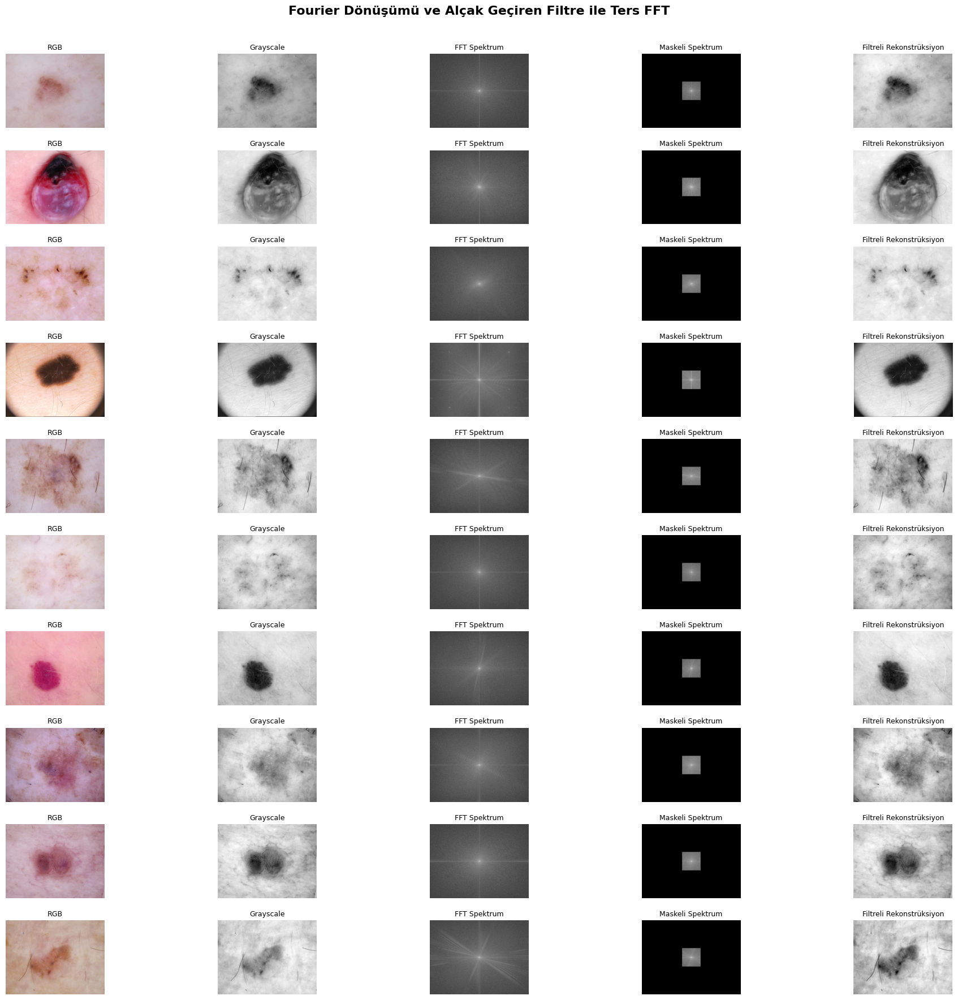

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# DataFrame'i yükle
train_df = load_dataframe()

# Rastgele 10 görüntü seç
sample_df = sample_images(train_df, n=10, random_state=42)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(20, 18))
fig.suptitle('Fourier Dönüşümü ve Alçak Geçiren Filtre ile Ters FFT', fontsize=16, fontweight='bold')

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    if img is None:
        rgb_img = None
        gray_img = None
        spectrum = None
        mask_img = None
        recon = None
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # FFT
        f = np.fft.fft2(gray_img)
        fshift = np.fft.fftshift(f)
        magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
        spectrum = magnitude_spectrum
        # Alçak geçiren filtre maskesi
        rows, cols = gray_img.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), np.uint8)
        r = min(rows, cols) // 8  # Maske yarıçapı
        mask[crow - r:crow + r, ccol - r:ccol + r] = 1
        # Maskeyi uygulama
        fshift_masked = fshift * mask
        magnitude_masked = 20 * np.log(np.abs(fshift_masked) + 1)
        mask_img = magnitude_masked
        # Ters FFT ile rekonstrüksiyon (uzamsal alana dönüş)
        f_ishift = np.fft.ifftshift(fshift_masked)
        img_back = np.fft.ifft2(f_ishift)
        img_back = np.abs(img_back)
        img_back = np.clip(img_back, 0, 255).astype(np.uint8)
        recon = img_back
    # Orijinal RGB
    axes[idx, 0].imshow(rgb_img)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('RGB', fontsize=9)
    # Grayscale
    axes[idx, 1].imshow(gray_img, cmap='gray')
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Grayscale', fontsize=9)
    # FFT Spektrum
    axes[idx, 2].imshow(spectrum, cmap='gray')
    axes[idx, 2].axis('off')
    axes[idx, 2].set_title('FFT Spektrum', fontsize=9)
    # Maskeli Spektrum
    axes[idx, 3].imshow(mask_img, cmap='gray')
    axes[idx, 3].axis('off')
    axes[idx, 3].set_title('Maskeli Spektrum', fontsize=9)
    # Ters FFT ile rekonstrüksiyon
    axes[idx, 4].imshow(recon, cmap='gray')
    axes[idx, 4].axis('off')
    axes[idx, 4].set_title('Filtreli Rekonstrüksiyon', fontsize=9)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.subplots_adjust(hspace=0.3)
plt.show()

7.Keskinleştirme ve Enterpolasyon

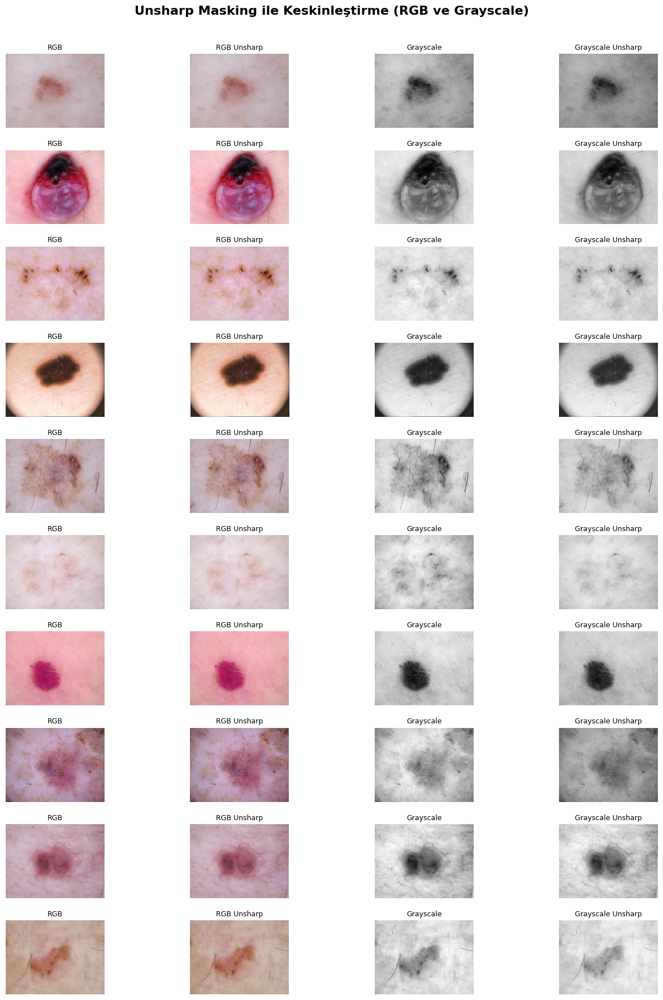

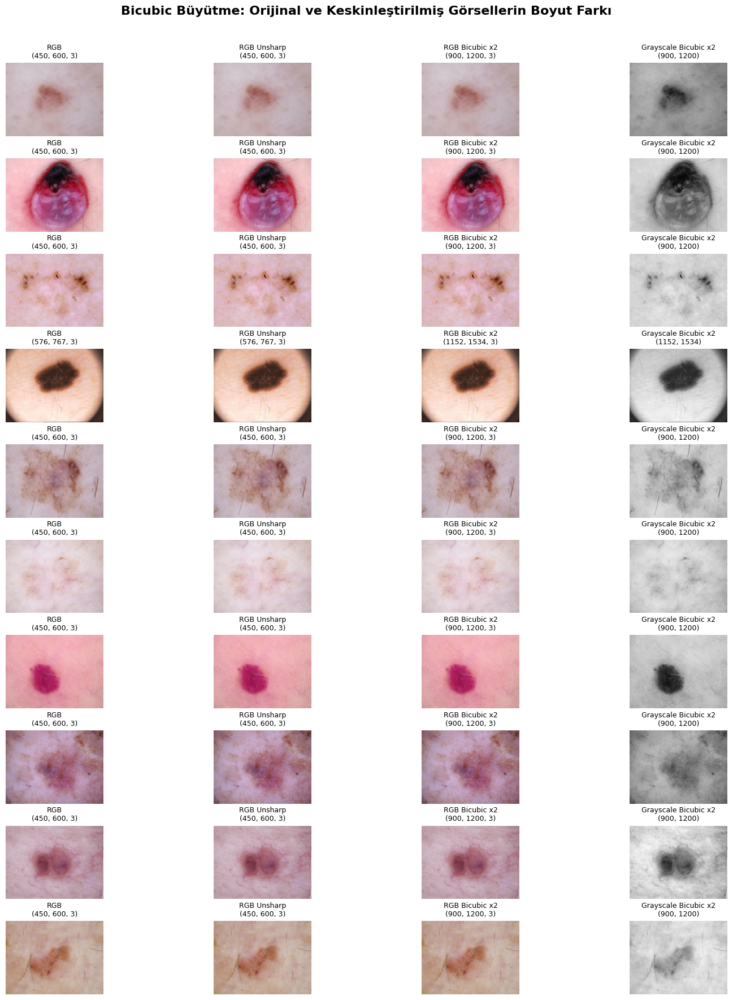

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# Unsharp Masking fonksiyonu
def unsharp_mask(img, kernel_size=(5,5), sigma=1.0, amount=1.0):
    blurred = cv2.GaussianBlur(img, kernel_size, sigma)
    sharpened = cv2.addWeighted(img, 1 + amount, blurred, -amount, 0)
    return sharpened

# Bicubic enterpolasyon ile 2 kat büyütme
def bicubic_resize(img):
    h, w = img.shape[:2]
    return cv2.resize(img, (w*2, h*2), interpolation=cv2.INTER_CUBIC)

# DataFrame'i yükle
train_df = load_dataframe()

# Rastgele 10 görüntü seç
sample_df = sample_images(train_df, n=10, random_state=42)

# 1. Görsel: RGB ve Grayscale için keskinleştirme karşılaştırması
fig1, axes1 = plt.subplots(nrows=10, ncols=4, figsize=(14, 18))
fig1.suptitle('Unsharp Masking ile Keskinleştirme (RGB ve Grayscale)', fontsize=16, fontweight='bold')

# 2. Görsel: Bicubic büyütme ve boyut farkı
fig2, axes2 = plt.subplots(nrows=10, ncols=4, figsize=(16, 18))
fig2.suptitle('Bicubic Büyütme: Orijinal ve Keskinleştirilmiş Görsellerin Boyut Farkı', fontsize=16, fontweight='bold')

for idx, row in enumerate(sample_df.itertuples()):
    img_path = row.filepath
    img = cv2.imread(img_path)
    if img is None:
        rgb_img = None
        gray_img = None
        rgb_sharp = None
        gray_sharp = None
        rgb_bicubic = None
        gray_bicubic = None
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rgb_sharp = unsharp_mask(rgb_img, kernel_size=(5,5), sigma=1.0, amount=1.0)
        gray_sharp = unsharp_mask(gray_img, kernel_size=(5,5), sigma=1.0, amount=1.0)
        rgb_bicubic = bicubic_resize(rgb_sharp)
        gray_bicubic = bicubic_resize(gray_sharp)
    # --- 1. Görsel ---
    # Orijinal RGB
    axes1[idx, 0].imshow(rgb_img)
    axes1[idx, 0].axis('off')
    axes1[idx, 0].set_title('RGB', fontsize=9)
    # Keskinleştirilmiş RGB
    axes1[idx, 1].imshow(rgb_sharp)
    axes1[idx, 1].axis('off')
    axes1[idx, 1].set_title('RGB Unsharp', fontsize=9)
    # Orijinal Grayscale
    axes1[idx, 2].imshow(gray_img, cmap='gray')
    axes1[idx, 2].axis('off')
    axes1[idx, 2].set_title('Grayscale', fontsize=9)
    # Keskinleştirilmiş Grayscale
    axes1[idx, 3].imshow(gray_sharp, cmap='gray')
    axes1[idx, 3].axis('off')
    axes1[idx, 3].set_title('Grayscale Unsharp', fontsize=9)
    # --- 2. Görsel ---
    # Orijinal RGB
    axes2[idx, 0].imshow(rgb_img)
    axes2[idx, 0].axis('off')
    axes2[idx, 0].set_title(f'RGB\n{rgb_img.shape}', fontsize=9)
    # Keskinleştirilmiş RGB (orijinal boyut)
    axes2[idx, 1].imshow(rgb_sharp)
    axes2[idx, 1].axis('off')
    axes2[idx, 1].set_title(f'RGB Unsharp\n{rgb_sharp.shape}', fontsize=9)
    # Bicubic büyütülmüş RGB
    axes2[idx, 2].imshow(rgb_bicubic)
    axes2[idx, 2].axis('off')
    axes2[idx, 2].set_title(f'RGB Bicubic x2\n{rgb_bicubic.shape}', fontsize=9)
    # Bicubic büyütülmüş Grayscale
    axes2[idx, 3].imshow(gray_bicubic, cmap='gray')
    axes2[idx, 3].axis('off')
    axes2[idx, 3].set_title(f'Grayscale Bicubic x2\n{gray_bicubic.shape}', fontsize=9)

fig1.tight_layout(rect=[0, 0, 1, 0.97])
fig1.subplots_adjust(hspace=0.3)
fig2.tight_layout(rect=[0, 0, 1, 0.97])
fig2.subplots_adjust(hspace=0.3)
plt.show()
